In [1]:
import os
from pathlib import Path
from importlib import reload

os.chdir("..")  # Change root dir to project folder
print(os.getcwd())

import utils.paths as paths

/hs/fs08/data/group-brueggen/tmartinez/diffusion/src


# Run PyBDSF analysis

Necessary Imports:

In [4]:
import numpy as np
import matplotlib.pyplot as plt

## Standard format for LDM/ICM Resampling and Sweep

1. Run script ldm_sweep_bdsf.py

2. Load results:

In [ ]:
import analysis.bdsf_analysis

reload(analysis.bdsf_analysis)
import analysis.ldm.io

reload(analysis.ldm.io)
from analysis.ldm.io import load_sweep_result

run_names = ["ascent-poplin"]

sweep_results = {
    name: load_sweep_result(name, bdsf_empty_is_err=False) for name in run_names
}

Loading results for <ascent-poplin>...


Loading BDSF results: 100%|██████████| 32/32 [00:04<00:00,  7.62it/s]

Done.


3. Load DR3 catalog for comparisons

In [ ]:
import data.utils

reload(data.utils)
from data.utils import load_lotss_catalog

# Load the catalog to compare with histograms
dr3_cat = load_lotss_catalog()
dr3_cat = dr3_cat[dr3_cat["Peak_flux"] > 1e-12]  # Filter out non-positive fluxes

Plots...

### Histograms

Making plots...


{'Integrated Flux': <Figure size 1200x800 with 1 Axes>,
 'Peak Flux': <Figure size 1200x800 with 1 Axes>,
 'Major Axis': <Figure size 1200x800 with 1 Axes>}

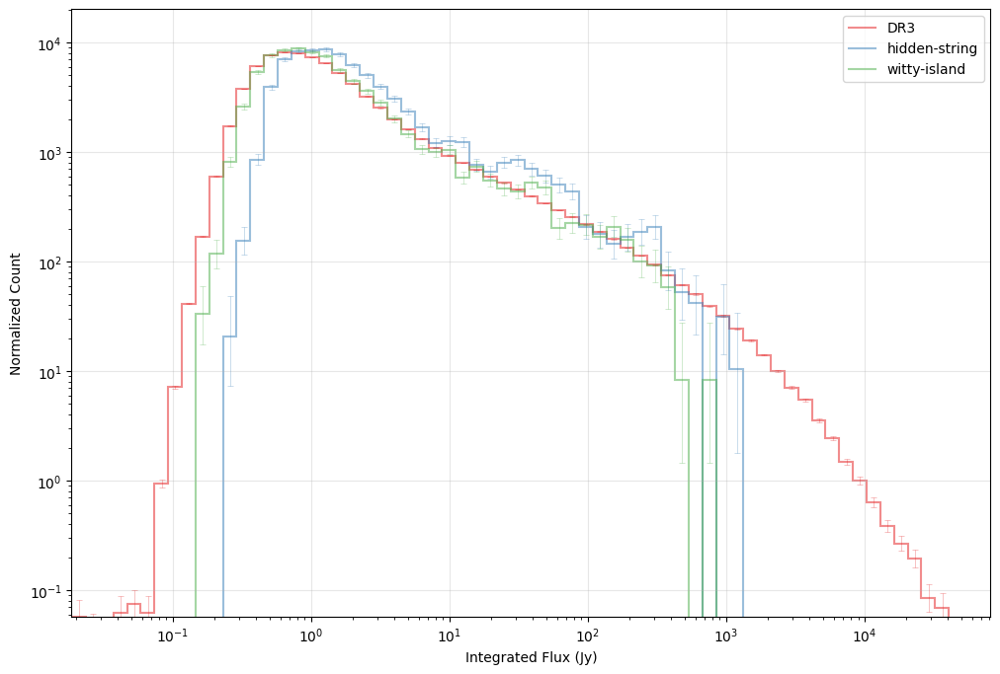

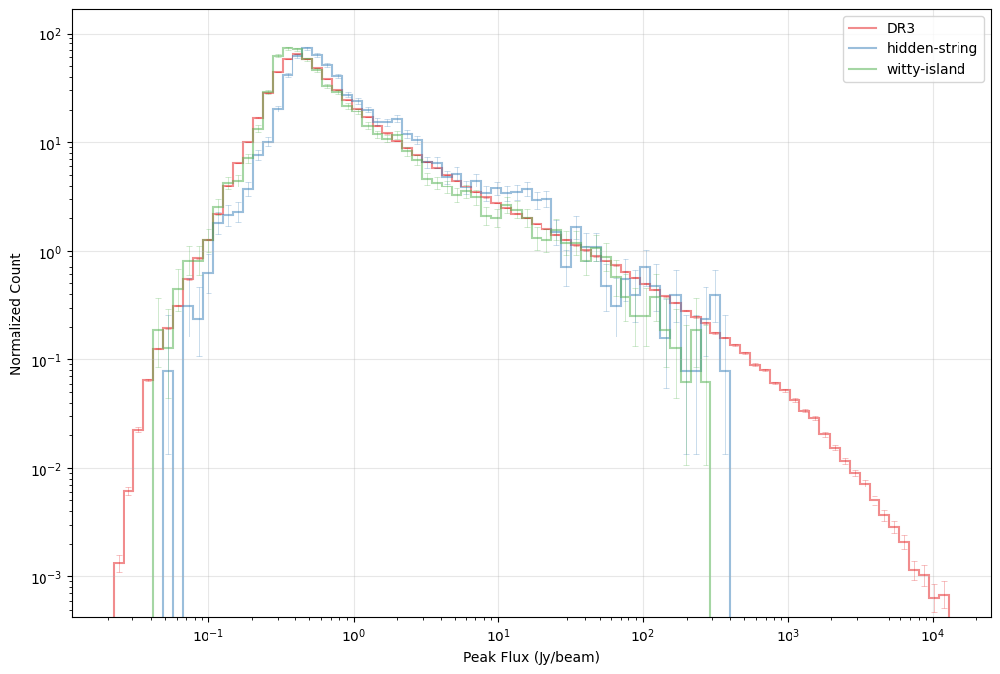

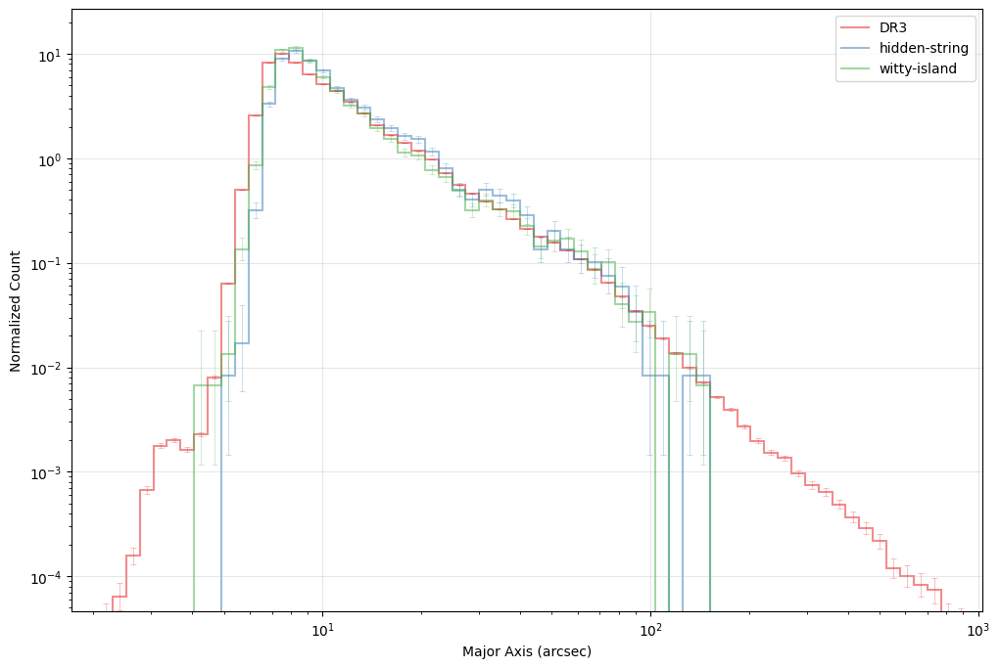

In [ ]:
import plotting.utils

reload(plotting.utils)

import plotting.catalog

reload(plotting.catalog)
from plotting.catalog import holy_trinity_histograms
import pandas as pd

# Merge all SRLs into one
merged_srls = {
    name: pd.concat(result["srls"], ignore_index=True)
    for name, result in sweep_results.items()
}

# Calculate area_degsq from sampling parameters
holy_trinity_histograms(
    [dr3_cat, *merged_srls.values()],
    catalog_names=["DR3", *merged_srls.keys()],
    logax=(True, True),
    make_plot=[True, True, True],
    density=True,
)

#### Other:

Residual RMS:

  0%|          | 0/2 [00:00<?, ?it/s]

100%|██████████| 2/2 [00:00<00:00, 12.81it/s]


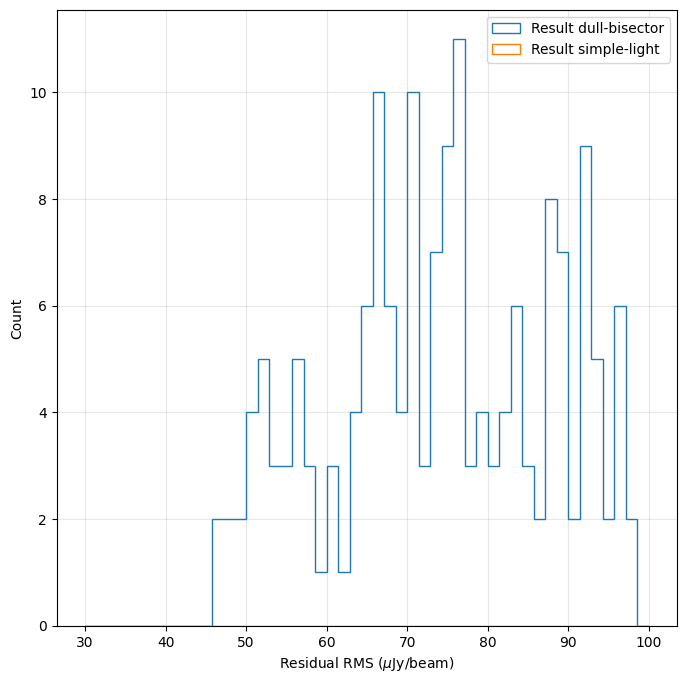

In [6]:
from tqdm import tqdm

fig, ax = plt.subplots(1, 1, figsize=(8, 8))

for res_name, res in tqdm(sweep_results.items()):
    rms = [
        np.sqrt(np.mean(bdsfres["resid_gaus_arr"] ** 2)) * 1e6
        for bdsfres in res["bdsf_results"]
    ]
    ax.hist(
        rms, bins=np.linspace(30, 100, 50), label=f"Result {res_name}", histtype="step"
    )

ax.grid(alpha=0.3)
ax.legend()

ax.set_xlabel(r"Residual RMS ($\mu$Jy/beam)")
ax.set_ylabel("Count")
# ax.set_yscale("log")

fig.show()

###  Select run:

In [6]:
import pandas as pd

# Use this to choose which run
run = run_names[-1]
print(f"Selected run <{run}>")

# Extract data from sweep results
res = sweep_results[run]  # dictionary holding all data
sampled_imgs = res["img_batch"]  # Sampled images
srls = res["srls"]  # List of pandas df output source catalogs
wcs = res["wcs"]  # List of WCS objects
pos_masks = res["pos_masks"]  # List of boolean masks for input sources
input_catalogs = res["input_catalogs"]
ctxt = res["ctxt_map"]

# Print overview
import pprint

pprint.pprint(list(res.keys()))
print("\n")
pprint.pp(res["summary"])

Selected run <ascent-poplin>
['img_batch',
 'ctxt_map',
 'bdsf_results',
 'summary',
 'wcs',
 'srls',
 'input_catalogs',
 'pos_masks',
 'original_imgs',
 'res_parent']


{'denoiser': 'LDM-Denoiser-WnetCC-v4',
 'denoiser_ckpt': 'best',
 'denoiser_ckpt_filename': '/hs/fs08/data/group-brueggen/tmartinez/model_results/LDM-Denoiser-WnetCC-v4/lightning/best-train_step=00260499-val_loss=1.23819e+00.ckpt',
 'uncond_denoiser': 'LDM-Denoiser-Uncond-128',
 'uncond_denoiser_ckpt': 'best',
 'vae': 'VQ-VAE-256',
 'device': 'cuda:1',
 'image_size': 512,
 'latent_size': 128,
 'quadrant_size': (5, 5),
 'batch_size': 4,
 'n_iter': 8,
 'cutout_size_px': (1536, 1536),
 'context_type': 'cat',
 'out_folder_lbl': '',
 'guidance_strength': 0.2,
 'f_inner': 1,
 'f_ext_ctxt': 2,
 'drop_inpainting_ctxt_at': -1,
 'use_latent_ctxt': True,
 'use_inpainting_replacement': True,
 'catalog_mode': 'combined',
 'save_intermediates': False,
 'do_bdsf': True,
 'bdsf_workers': 8,
 'total_images': 32,
 'successful_images': 3

#### Other:

Plot the context

(<Figure size 1000x1000 with 4 Axes>,
 array([[<Axes: >, <Axes: >],
        [<Axes: >, <Axes: >]], dtype=object))

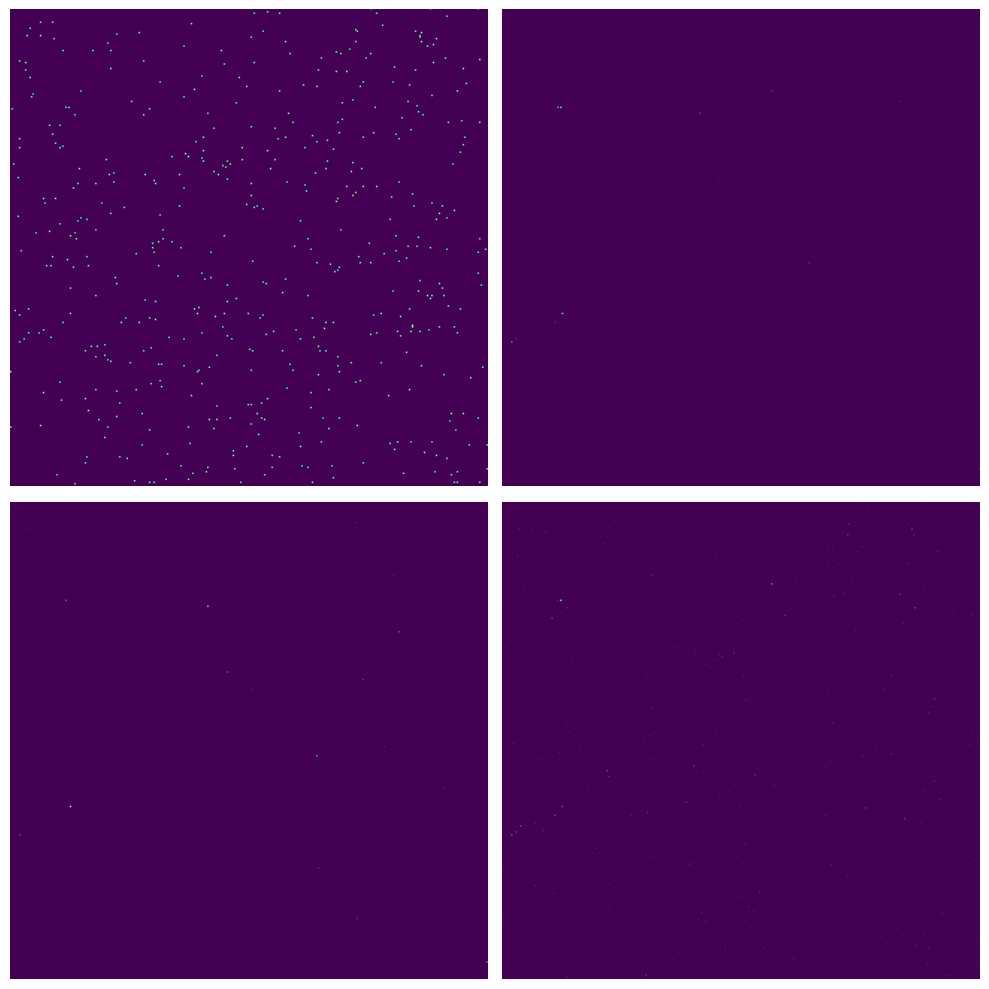

In [ ]:
# import log colornorm
from plotting.images import plot_image_grid

plot_image_grid(
    res["ctxt_map"][0],
    # norm=LogNorm()
)

In [ ]:
from data.utils import load_mosaic
from data.trf.scalers import LOFARScaler


def get_slice(img, cutout_size_px):
    cby2, cpx = cutout_size_px // 2, img.shape[-1] // 2
    sl = slice(cpx - cby2, cpx + cby2)
    return sl


scaler = LOFARScaler.load("LOFAR_scaler_II")

### Plot Maps w. Source positions

In [ ]:
# Expand context map for plotting with images
from data.obs.micromaps.utils import expand_context_map

ctxt_map_exp = expand_context_map(res["ctxt_map"], f_upscale=4)


# Create batch iterator that returns a desired number of images per batch.
# Convenient for e.g. plotting.
n_side = 2
n_batch = n_side**2
batch_iter = iter(
    range(len(sampled_imgs) // n_batch + int(bool(len(sampled_imgs) % n_batch)))
)

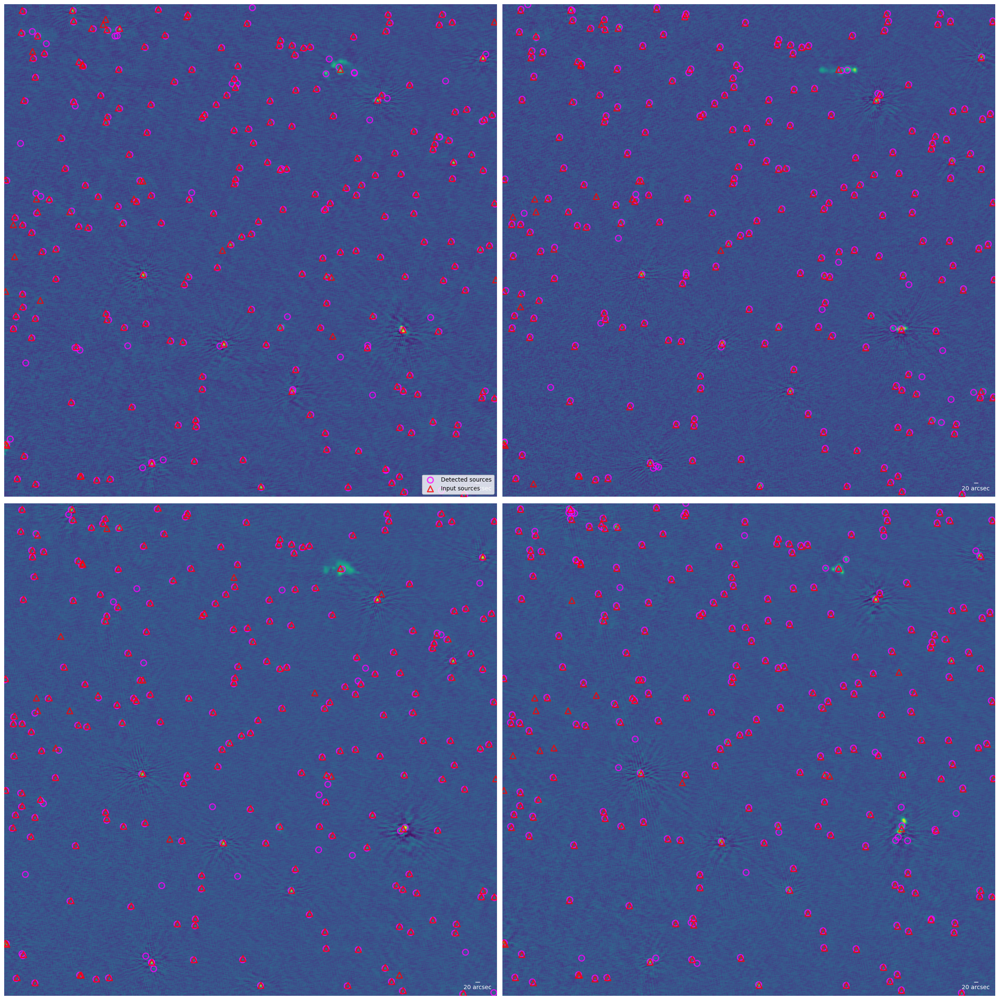

In [25]:
import plotting.images

reload(plotting.images)
from plotting.images import plot_image_grid
from astropy.coordinates import SkyCoord
import astropy.units as u
from astropy.visualization.wcsaxes import add_scalebar
import pandas as pd
import data.obs.micromaps.utils

reload(data.obs.micromaps.utils)


# Select batch index
i_batch = 4

# We do multiple at once, i.e. plot in batches.
# Define parameters for batch extraction:
n_side = 2  # Side length of plot grid
n_batch = n_side**2
batch_slice = slice(
    i_batch * n_batch, min((i_batch + 1) * n_batch, sampled_imgs.shape[0])
)

# Extract batch data:
batch = sampled_imgs[batch_slice]
srl_batch = srls[batch_slice]
ctxt = res["ctxt_map"][batch_slice]
ctxt_exp = ctxt_map_exp[batch_slice]

# If input position masks exist, we can extract those for the batch.
# Also then, input catalogs will exist.
input_catalogs = None
if res["pos_masks"] is not None:
    pos_masks_batch = pos_masks[batch_slice]
    input_catalogs = pd.concat(res["input_catalogs"], ignore_index=True)

# Plot batch on grid
fig, axs = plot_image_grid(batch, img_side_len=12, subplot_kw={"projection": wcs})

# Add overlaid source positions:
for i, (ax, srl) in enumerate(zip(axs.flatten() if n_side > 1 else [axs], srl_batch)):

    # Marker settings for scatter plots
    scatter_kw = dict(
        s=100,
        linewidth=2,
        alpha=0.8,
    )

    # Scatter output coords
    ax.scatter_coord(
        SkyCoord(srl["RA"], srl["DEC"], unit="deg"),
        marker="o",
        # c=np.log(srl["Peak_flux"].values),
        # cmap="inferno",
        facecolor="none",
        color="fuchsia",
        label="Detected sources",
        **scatter_kw,
    )

    # Input coords from context map
    pos_mask = pos_masks_batch[i] if input_catalogs is not None else ctxt_exp[i][0] == 1

    # Convert array indices to world coordinates
    input_coords = SkyCoord(
        wcs.array_index_to_world_values(np.flip(np.argwhere(pos_mask), axis=1)),
        unit="deg",
    )

    # Scatter input coords
    ax.scatter_coord(
        input_coords,
        marker="^",
        # c=np.log(ctxt[i][2][pos_mask].ravel()),
        # cmap="inferno",
        facecolor="none",
        color="red",
        label="Input sources",
        **scatter_kw,
    )

    # Add scalebar
    add_scalebar(
        ax,
        20 * u.arcsec,
        color="white",
        label="20 arcsec",
        # fontproperties=dict(size=plt.rcParams["font.size"]),
    )

    # Add legend to first subplot
    if not i:
        ax.legend()


fig.show()

#### Other:

Only source coordinates:

In [ ]:
i = 2

ctxt = ctxt_map_exp[i]
srl = srls[i]
# Input values
pos_mask = pos_masks[i] if pos_masks is not None else ctxt[0] == 1
nsrc = int(pos_mask.sum())


fig, axs = plt.subplots(
    1, 2, figsize=(12, 6), subplot_kw={"projection": wcs, "box_aspect": 1}
)


# Define common color scale
fpeak_in = (
    input_catalogs["Peak_flux"].values[i * nsrc : (i + 1) * nsrc]
    if input_catalogs is not None
    else ctxt[2][pos_mask].ravel()
)
fpeak_out = srl["Peak_flux"].values
all_fpeak = np.concatenate([fpeak_in, fpeak_out])
vmin = np.log(all_fpeak).min()
vmax = np.log(all_fpeak).max()


axs[0].scatter_coord(
    SkyCoord(srl["RA"], srl["DEC"], unit="deg"),
    marker="o",
    c=np.log(fpeak_out),
    cmap="inferno",
    vmin=vmin,
    vmax=vmax,
    # facecolor="none",
    # color="red",
    s=50,
    alpha=0.8,
)


input_coords = SkyCoord(
    wcs.array_index_to_world_values(np.flip(np.argwhere(pos_mask), axis=1)),
    # wcs.array_index_to_world_values(np.argwhere(pos_mask)),
    unit="deg",
)
axs[1].scatter_coord(
    input_coords,
    marker="^",
    c=np.log(fpeak_in),
    cmap="inferno",
    vmin=vmin,
    vmax=vmax,
    # facecolor="none",
    # color="red",
    s=50,
    alpha=0.8,
)

### Source matching scatter plots

Source Matching:

In [ ]:
import analysis.ldm

reload(analysis.ldm)

<module 'analysis.ldm' (<_frozen_importlib_external.NamespaceLoader object at 0x7f4482a74a50>)>

In [26]:
import analysis.ldm.match as ldm_match

reload(ldm_match)

combined_dict, match_dicts, input_cat = ldm_match.match_sources(res)
all_inp, all_outp, all_d2d = list(combined_dict.values())

 15:11:21 (ldm-match) - INFO : Extracting data from resample result...
 15:11:21 (ldm-match) - INFO : Matching sources...
100%|██████████| 32/32 [00:03<00:00,  9.23it/s]
 15:11:24 (ldm-match) - INFO : Concatenating matched data...
 15:11:24 (ldm-match) - INFO : Done matching sources.

              Total input sources:	8988
             Total output sources:	9319
            Total matched sources:	8231
    Total unmatched input sources:	757
   Total unmatched output sources:	988



#### Scatter Plots:

Input-Output for all three:

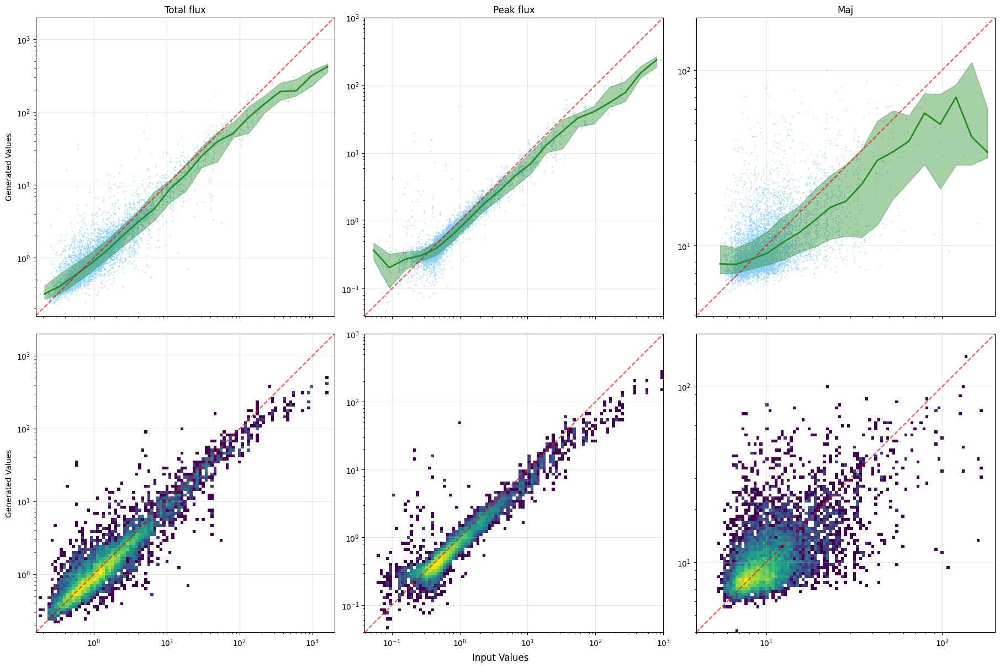

In [ ]:
import plotting.ldm as pltldm

reload(pltldm)

fig, axs = pltldm.source_matching_scatter_plot(
    combined_dict,
    save_path=res["res_parent"] / "plots" / f"input_output_scatter_plot_{run}.png",
)

Relative deviation:

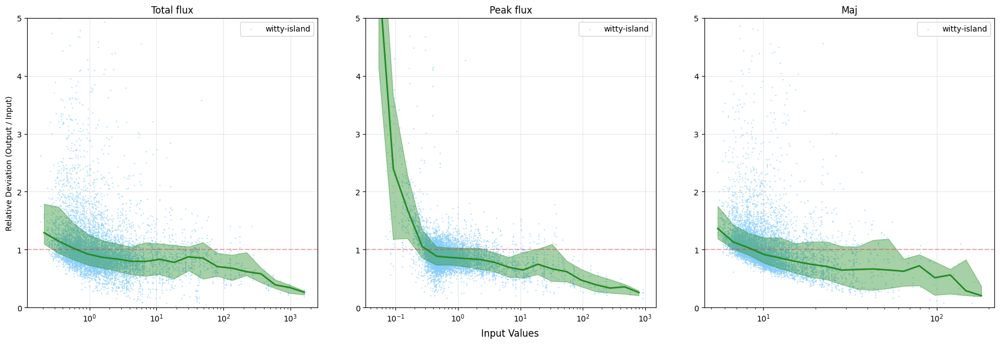

In [ ]:
from matplotlib.colors import LogNorm
from plotting.utils import auto_log_bins

# Initialize figure
fig, axs = plt.subplots(
    1,
    3,
    figsize=(18, 6),
    sharex="col",
    constrained_layout=True,
    subplot_kw=dict(
        box_aspect=1,
    ),
    # gridspec_kw=dict(height_ratios=[1, 1, 0.25])
)

titles = ["Total_flux", "Peak_flux", "Maj"]


for i, title in enumerate(titles):

    # First row: scatter plot with binned median and 1-sigma lines
    ax = axs[i]

    # Calculate relative deviation
    ratio = all_outp[i] / all_inp[i]

    # Scatter plot
    ax.scatter(all_inp[i], ratio, s=0.5, alpha=0.6, label=run, color="lightskyblue")
    ax.legend()

    # binning for median and 1-sigma
    bin_edges = auto_log_bins([all_inp[i], all_outp[i]], num=20)
    bin_centers = 0.5 * (bin_edges[1:] + bin_edges[:-1])
    digitized = np.digitize(all_inp[i], bin_edges)
    medians, means, sigmas_low, sigmas_high = [
        np.zeros(len(bin_edges) - 1) for _ in range(4)
    ]
    for j in range(1, len(bin_edges)):
        bin_vals = ratio[digitized == j]
        if len(bin_vals):
            medians[j - 1] = np.median(bin_vals)
            means[j - 1] = np.mean(bin_vals)
            sigmas_low[j - 1] = np.percentile(bin_vals, 16)
            sigmas_high[j - 1] = np.percentile(bin_vals, 84)
    nonzero_mask = medians > 0
    medians = medians[nonzero_mask]
    means = means[nonzero_mask]
    sigmas_low = sigmas_low[nonzero_mask]
    sigmas_high = sigmas_high[nonzero_mask]

    # Plot lines
    ax.plot(
        bin_centers[nonzero_mask],
        medians,
        color="forestgreen",
        lw=2,
        label="Binned median",
    )
    ax.fill_between(
        bin_centers[nonzero_mask],
        sigmas_high,
        sigmas_low,
        color="forestgreen",
        alpha=0.4,
        label="16-84th percentile",
    )
    # ax.plot(bin_centers[nonzero_mask], sigmas_low, color="orange", lw=2, ls="--", label="16th percentile")
    # ax.plot(bin_centers[nonzero_mask], sigmas_high, color="orange", lw=2, ls="--", label="84th percentile")
    ax.set_title(title.replace("_", " ").capitalize())

    # Plot 1:1 line
    ax.axhline(
        1,
        ls="--",
        color="red",
        alpha=0.3,
    )


# Set axis scales and grid
for ax in axs.flatten():
    # ax.set_box_aspect(1)
    ax.set_xscale("log")
    # ax.set_yscale("log")
    ax.grid(alpha=0.3)
    ax.set_ylim(0, 5)

# Add labels
fig.supxlabel("Input Values")
axs[0].set_ylabel("Relative Deviation (Output / Input)")

fig.show()

#### Histograms:

Making plots...


{'Integrated Flux': <Figure size 1200x800 with 1 Axes>,
 'Peak Flux': <Figure size 1200x800 with 1 Axes>,
 'Major Axis': <Figure size 1200x800 with 1 Axes>}

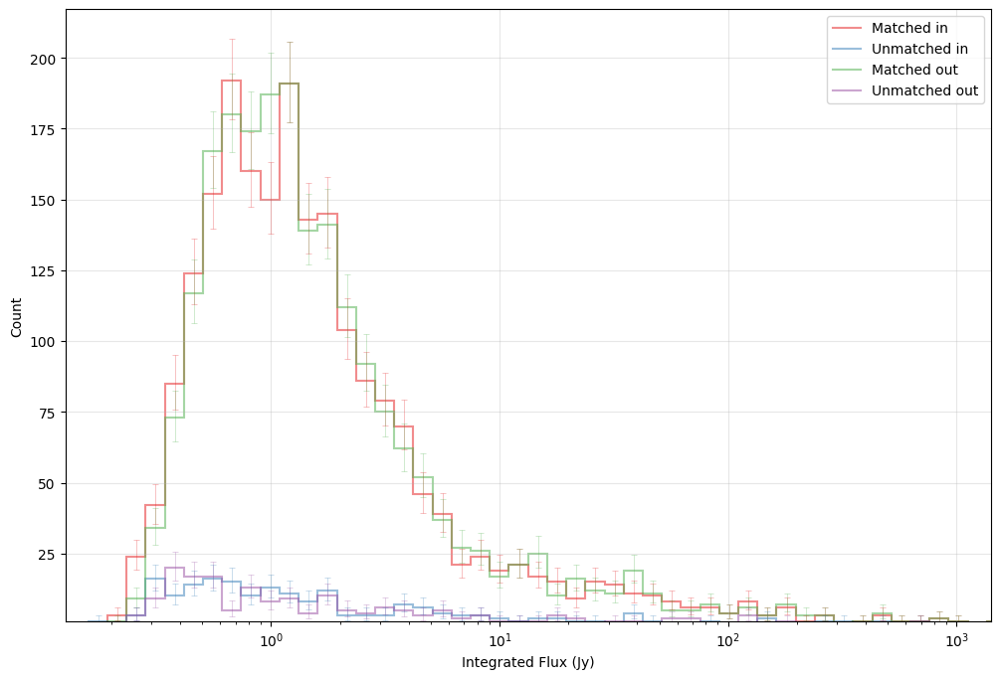

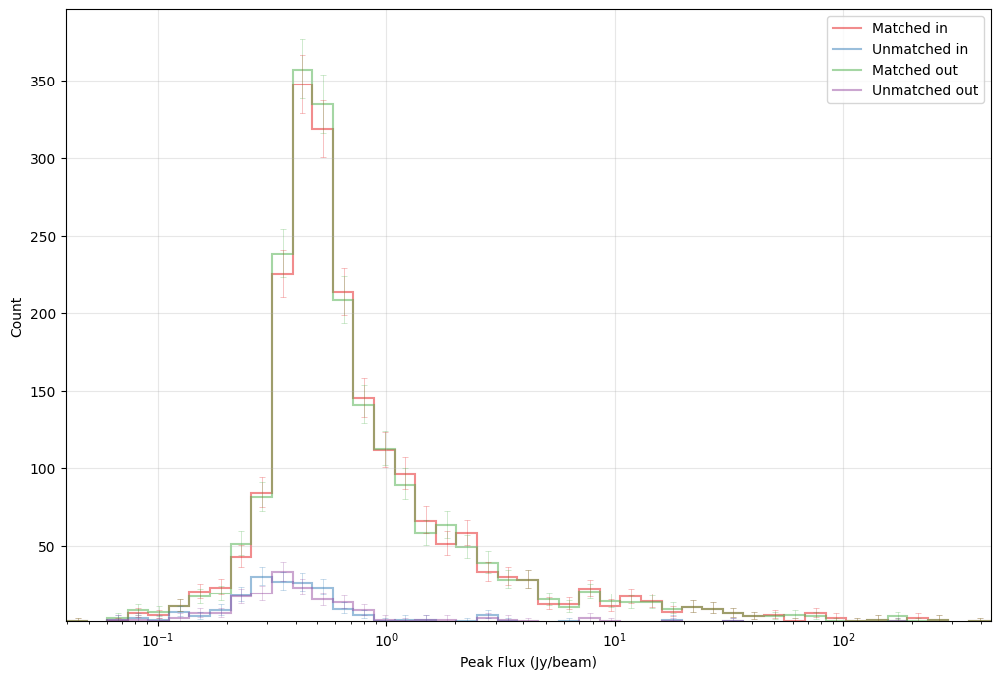

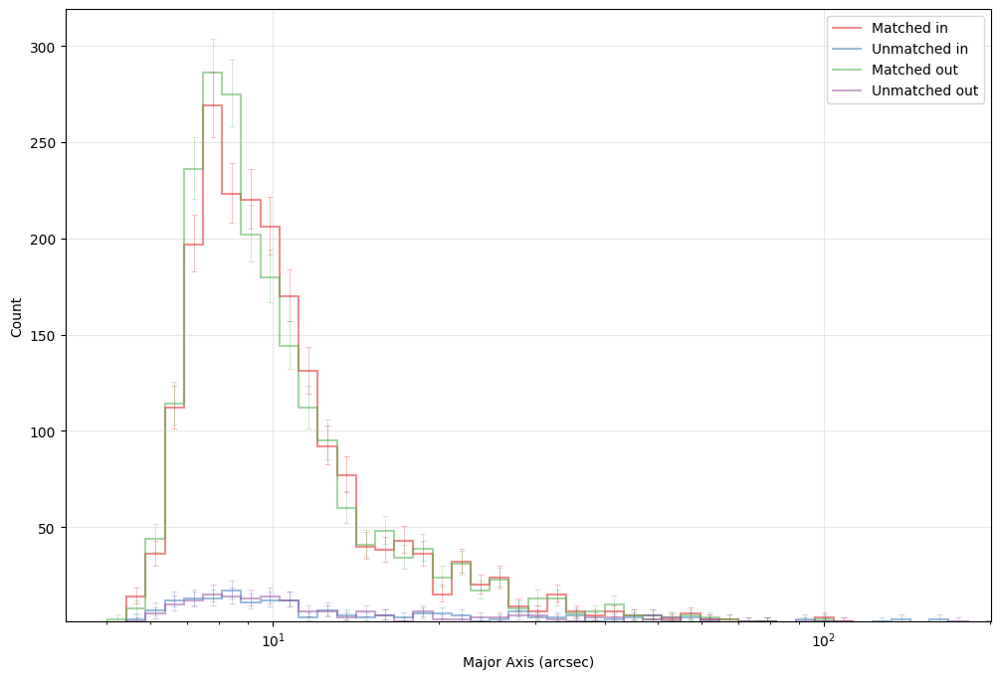

In [49]:
import plotting.catalog

reload(plotting.catalog)
from plotting.catalog import holy_trinity_histograms
import pandas as pd

# Merge srls into one
match_dict_merged = {
    key: pd.concat([md[key] for md in match_dicts], ignore_index=True)
    for key in match_dicts[0].keys()
}

# Get names from keys
names = [m.replace("_", " ").capitalize() for m in match_dict_merged.keys()]

# Calculate area_degsq from sampling parameters
holy_trinity_histograms(
    list(match_dict_merged.values()),
    catalog_names=names,
    logax=(True, False),
    make_plot=[True, True, True],
    density=False,
    nonzero_bin_thresh=1,
    n_bins=50,
)

#### Other:

Run PyBDSF and Source Matching on original image:

(<Figure size 1000x2000 with 8 Axes>,
 array([[<Axes: >, <Axes: >],
        [<Axes: >, <Axes: >],
        [<Axes: >, <Axes: >],
        [<Axes: >, <Axes: >]], dtype=object))

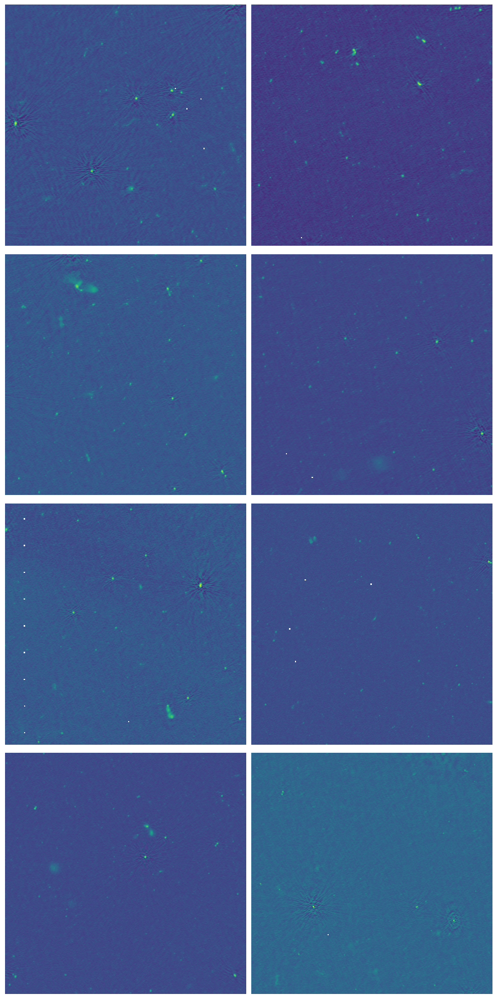

In [20]:
from plotting.images import plot_image_grid
from data.trf.scalers import LOFARScaler

scaler = LOFARScaler.load("LOFAR_scaler_II")

big_img_batch = res["original_imgs"]

plot_image_grid(scaler.scale(big_img_batch))

In [ ]:
from analysis.bdsf_analysis import tiered_bdsf_wrapper, save_multistep_output
import contextlib


def process_img(img_idx, img_batch):
    """Process a single batch with BDSF analysis"""
    try:
        # Extract single image from batch
        img = img_batch[img_idx].squeeze()

        # Run BDSF analysis with output suppressed
        with (
            contextlib.redirect_stdout(open(os.devnull, "w")),
            contextlib.redirect_stderr(open(os.devnull, "w")),
        ):
            result = tiered_bdsf_wrapper(img, quiet=True)

        return result, True, None
    except Exception as e:
        return None, False, str(e)

In [ ]:
from tqdm import tqdm
import concurrent.futures


big_img_batch = res["original_imgs"]


# Set number of workers - ThreadPoolExecutor can handle more workers since it's lighter
max_workers = 8

# Run parallel processing with ThreadPoolExecutor
results = {}
img_indices = list(range(len(big_img_batch)))

with concurrent.futures.ProcessPoolExecutor(max_workers=max_workers) as executor:
    # Submit all tasks
    future_to_batch = {
        executor.submit(process_img, img_idx, big_img_batch): img_idx
        for img_idx in img_indices
    }

    # Process results with progress bar
    with tqdm(total=len(img_indices), desc="BDSF Analysis") as pbar:
        for future in concurrent.futures.as_completed(future_to_batch):
            img_idx = future_to_batch[future]
            result = future.result()
            bdsf_result, success, error = result
            if not success:
                raise RuntimeError(
                    f"BDSF analysis failed for image index {img_idx} with error: {error}"
                )
            results[img_idx] = bdsf_result
            pbar.update(1)

BDSF Analysis: 100%|██████████| 8/8 [03:07<00:00, 23.40s/it] 


In [ ]:
results[0][0]["catalogs"]["srl"]

,Source_id,Isl_id,RA,E_RA,DEC,E_DEC,Total_flux,E_Total_flux,Peak_flux,E_Peak_flux,...,DC_PA_img_plane,E_DC_PA_img_plane,Isl_Total_flux,E_Isl_Total_flux,Isl_rms,Isl_mean,Resid_Isl_rms,Resid_Isl_mean,S_Code,Flag_beam
0,0,0,359.998154,0.000255,0.157109,0.000210,16.379422,0.001197,0.751743,0.000053,...,76.425533,13.928307,0.009114,0.000295,0.000093,0.0,0.000081,2.488198e-05,S,0
1,1,1,359.997845,0.000023,0.544034,0.000020,13.553112,0.001310,4.282949,0.000095,...,168.898083,12.008175,0.006920,0.000166,0.000095,0.0,0.000038,4.959653e-08,M,0
2,2,2,359.995995,0.000057,0.479288,0.000061,2.100864,0.000229,1.510470,0.000105,...,38.608351,17.713293,0.002027,0.000162,0.000099,0.0,0.000036,3.031791e-06,S,0
3,3,3,359.994272,0.000091,0.388783,0.000113,2.799844,0.000380,1.303598,0.000127,...,171.486775,26.339231,0.002732,0.000210,0.000117,0.0,0.000069,4.993155e-06,S,0
4,4,4,359.989795,0.000216,0.540654,0.000202,0.956637,0.000288,0.491577,0.000104,...,65.511468,133.461846,0.000767,0.000136,0.000095,0.0,0.000014,-2.232418e-05,S,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
192,192,195,359.393063,0.000292,0.000434,0.000229,7.873946,0.002265,2.904018,0.000633,...,113.081712,34.984078,0.037611,0.000826,0.000595,0.0,0.007860,3.837383e-03,S,0
193,193,196,359.364048,0.000583,0.565462,0.000640,4.128209,0.000932,0.254130,0.000054,...,29.335291,52.371915,0.004984,0.000244,0.000084,0.0,0.000055,2.769536e-05,S,0
194,194,197,359.786808,0.000435,0.129564,0.000794,13.844722,0.001648,0.349958,0.000041,...,22.379273,4.226021,0.028313,0.000520,0.000095,0.0,0.000100,5.571622e-05,S,0
195,195,198,359.554365,0.000800,0.291712,0.000675,38.197346,0.005590,0.975808,0.000309,...,38.843106,6.499182,0.478072,0.002402,0.000309,0.0,0.000355,1.845834e-04,M,0


In [ ]:
res["ctxt_map"][::4].shape

(8, 4, 384, 384)

In [ ]:
from tqdm import tqdm
from astropy.coordinates import SkyCoord
import astropy.units as u
import data.obs.micromaps.utils
import pandas as pd
import torch

reload(data.obs.micromaps.utils)
from data.obs.micromaps.utils import expand_context_map

batch_size = 4
unique_ctxt_map = res["ctxt_map"][::batch_size]
original_srls = [results[i][0]["catalogs"]["srl"] for i in range(len(results))]

# Expand context map to match image dimensions
ctxt_map_exp = expand_context_map(unique_ctxt_map, f_upscale=4)
# If working with scaled context values, we need to invert the scaling
if ctxt_scaled:
    ctxt_map_exp = inv_scale_trf(torch.tensor(ctxt_map_exp)).numpy()

# prepare to collect all matched/unmatched sources
all_inp = []
all_outp = []
all_d2d = []
match_dicts = []
input_cat = None  # Start value, will be filled in loop

# Loop through output source lists
for i in tqdm(range(len(original_srls)), total=len(original_srls)):

    # Get output catalog for this image
    # srl = srls[i]
    srl = original_srls[i]

    # if we have no position masks, we get the input catalog from the context map
    if pos_masks is None:

        # Get context map for this image
        ctxt = ctxt_map_exp[i]

        # Extract input catalog from context map
        input_coords, inp_vals, input_subcat = input_cat_from_context_map(ctxt)
        input_ftot, input_fpeak, input_maj = inp_vals

    # If otherwise we have position masks, that means we also have input catalogs
    else:
        pos_mask = pos_masks[i]
        input_coords = SkyCoord(
            wcs.array_index_to_world_values(
                np.flip(np.argwhere(pos_mask == 1), axis=1)
            ),
            unit="deg",
        )
        nsrc = int(pos_mask.sum())
        input_subcat = (
            input_catalogs.iloc[nsrc * i : nsrc * (i + 1)].copy().reset_index(drop=True)
        )
        input_subcat["RA"] = input_coords.ra.deg
        input_subcat["DEC"] = input_coords.dec.deg
        input_ftot, input_fpeak, input_maj = inp_vals = np.array(
            [input_subcat[col].values for col in ["Total_flux", "Peak_flux", "Maj"]]
        )

    # Append to overall input catalog
    input_cat = (
        pd.concat([input_cat, input_subcat], ignore_index=True)
        if input_cat is not None
        else input_subcat
    )

    # Nearest-neighbor matching between input coords and srl

    # If no sourced are found in image, srl is None
    if srl is None:
        # All input is unmatched
        match_dict = {
            "matched_in": pd.DataFrame({}),
            "unmatched_in": input_cat,
            "matched_out": pd.DataFrame({}),
            "unmatched_out": pd.DataFrame({}),
        }
        match_dicts.append(match_dict)
        all_inp.append(inp_vals)
        all_outp.append(np.zeros((3, 0)))
        all_d2d.append(np.array([]))
        continue

    # Define coordinates for output sources
    srl_coords = SkyCoord(ra=srl["RA"], dec=srl["DEC"], unit="deg")

    # idx are indices into input_coords that correspond to the
    # nearest neighbor of srl_coords (i.e. len(idx) = len(srl_coords))
    idx, d2d, _ = srl_coords.match_to_catalog_sky(input_coords)

    # Apply distance threshold
    dist_mask = d2d.to(u.arcsec).value <= 10  # arcsec

    # Count occurrences of each index to handle duplicates (or multiples)
    unique_idx, count = np.unique(idx[dist_mask], return_counts=True)

    # Make dictionary with matched and unmatched catalogs for both input and output
    match_dict = {
        "matched_in": input_subcat.iloc[unique_idx],
        "unmatched_in": input_subcat.drop(index=unique_idx),
        "matched_out": srl.iloc[dist_mask],
        "unmatched_out": srl.drop(index=np.where(dist_mask)[0]),
    }
    match_dicts.append(match_dict)

    # Output exists for all indices presend in idx
    out_vals = np.zeros((len(unique_idx), 3))

    # Sources with multiple counts are merged:
    # - Total_flux is summed
    # - Peak_flux uses the maximum
    # - Maj uses the maximum (this is crappy tho)
    for j, i in enumerate(unique_idx):
        sub_srl = srl[idx == i]
        out_vals[j] = [
            sub_srl["Total_flux"].sum(),
            sub_srl["Peak_flux"].max(),
            sub_srl["Maj"].max(),
        ]

    # Collect matched input and output values and distances
    all_inp.append(inp_vals[:, unique_idx])
    all_outp.append(out_vals.T)
    all_d2d.append(d2d.to(u.arcsec).value)

# Concatenate all collected data, i.e. convert lists to arrays
all_inp = np.concatenate(all_inp, axis=1)
all_outp = np.concatenate(all_outp, axis=1)
all_d2d = np.concatenate(all_d2d, axis=0)

100%|██████████| 8/8 [00:01<00:00,  7.98it/s]


In [43]:
# Print statistics
print(
    f"Total input sources: {sum([len(md['matched_in']) + len(md['unmatched_in']) for md in match_dicts])}"
)
print(
    f"Total output sources: {sum([len(srl) if srl is not None else 0 for srl in original_srls])}"
)
print(f"Total matched sources: {sum([len(md['matched_in']) for md in match_dicts])}")
print(
    f"Total unmatched input sources: {sum([len(md['unmatched_in']) for md in match_dicts])}"
)
print(
    f"Total unmatched output sources: {sum([len(md['unmatched_out']) for md in match_dicts])}"
)

Total input sources: 2247
Total output sources: 2259
Total matched sources: 2066
Total unmatched input sources: 181
Total unmatched output sources: 167


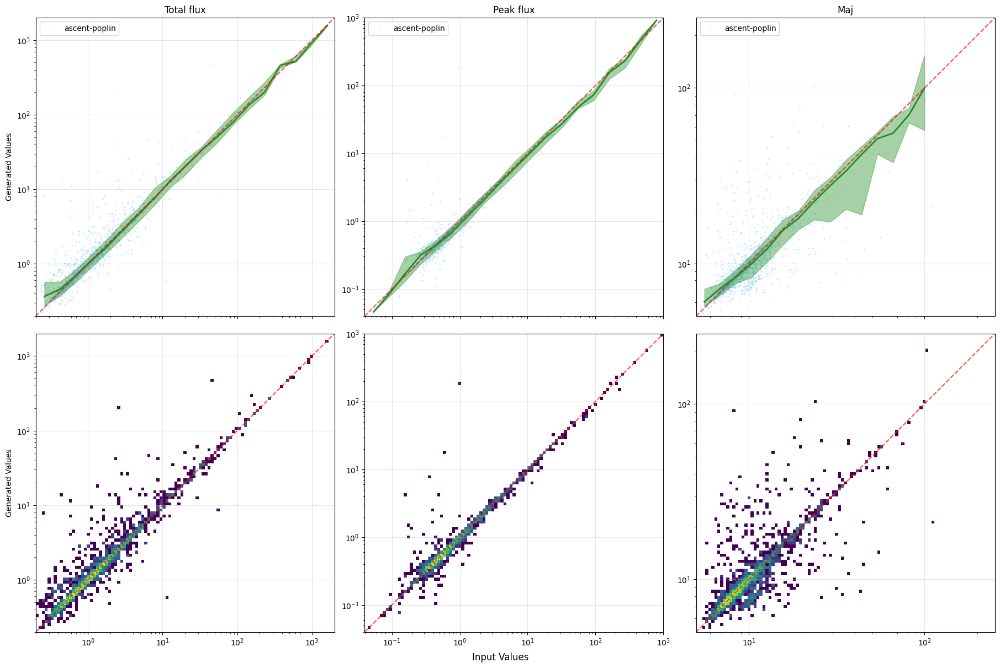

In [44]:
from matplotlib.colors import LogNorm
from plotting.utils import auto_log_bins

# Initialize figure
fig, axs = plt.subplots(
    2,
    3,
    figsize=(18, 12),
    sharex="col",
    constrained_layout=True,
    subplot_kw=dict(
        box_aspect=1,
    ),
    # gridspec_kw=dict(height_ratios=[1, 1, 0.25])
)

titles = ["Total_flux", "Peak_flux", "Maj"]


for i, title in enumerate(titles):

    # First row: scatter plot with binned median and 1-sigma lines
    ax = axs[0][i]

    # Scatter plot
    ax.scatter(
        all_inp[i], all_outp[i], s=0.5, alpha=0.6, label=run, color="lightskyblue"
    )
    ax.legend()

    # binning for median and 1-sigma
    bin_edges = auto_log_bins([all_inp[i], all_outp[i]], num=20)
    bin_centers = 0.5 * (bin_edges[1:] + bin_edges[:-1])
    digitized = np.digitize(all_inp[i], bin_edges)
    medians, means, sigmas_low, sigmas_high = [
        np.zeros(len(bin_edges) - 1) for _ in range(4)
    ]
    for j in range(1, len(bin_edges)):
        bin_vals = all_outp[i][digitized == j]
        if len(bin_vals):
            medians[j - 1] = np.median(bin_vals)
            means[j - 1] = np.mean(bin_vals)
            sigmas_low[j - 1] = np.percentile(bin_vals, 16)
            sigmas_high[j - 1] = np.percentile(bin_vals, 84)
    nonzero_mask = medians > 0
    medians = medians[nonzero_mask]
    means = means[nonzero_mask]
    sigmas_low = sigmas_low[nonzero_mask]
    sigmas_high = sigmas_high[nonzero_mask]

    # Plot lines
    ax.plot(
        bin_centers[nonzero_mask],
        medians,
        color="forestgreen",
        lw=2,
        label="Binned median",
    )
    ax.fill_between(
        bin_centers[nonzero_mask],
        sigmas_high,
        sigmas_low,
        color="forestgreen",
        alpha=0.4,
        label="16-84th percentile",
    )
    # ax.plot(bin_centers[nonzero_mask], sigmas_low, color="orange", lw=2, ls="--", label="16th percentile")
    # ax.plot(bin_centers[nonzero_mask], sigmas_high, color="orange", lw=2, ls="--", label="84th percentile")
    ax.set_title(title.replace("_", " ").capitalize())

    # Second row:2D histogram
    ax = axs[1][i]
    ax.hist2d(
        all_inp[i],
        all_outp[i],
        bins=auto_log_bins([all_inp[i], all_outp[i]], num=100),
        cmap="viridis",
        norm=LogNorm(),
    )

    # set the axis limits of row 1 to those of row 2
    # (Becuase here we use optimized bin range in auto_log_bins())
    axs[0][i].set_xlim(ax.get_xlim())
    axs[0][i].set_ylim(ax.get_ylim())

    # Plot 1:1 line
    for ax in axs.flatten():
        ax.axline(
            [
                all_inp[i].mean(),
            ]
            * 2,
            slope=1,
            ls="--",
            color="red",
            alpha=0.3,
        )


# Set axis scales and grid
for ax in axs.flatten():
    # ax.set_box_aspect(1)
    ax.set_xscale("log")
    ax.set_yscale("log")
    ax.grid(alpha=0.3)

# Add labels
fig.supxlabel("Input Values")
axs[0][0].set_ylabel("Generated Values")
axs[1][0].set_ylabel("Generated Values")

fig.show()

Nearest-Neighbor Distances Distribution

In [ ]:
fig, ax = plt.subplots(1, 1, figsize=(8, 8))

counts, bins = np.histogram(all_d2d, bins=np.logspace(-2, 2, 100))
cumsum = np.cumsum(counts)

plt.stairs(counts, bins)
ax.grid(alpha=0.3, which="major")
ax.grid(alpha=0.3, ls=":", which="minor")
ax.tick_params(bottom=True, labelbottom=True, top=True, labeltop=True)
ax.set_xscale("log")
ax.set_yscale("log")

fig.show()

Individual seaborn jointplot:

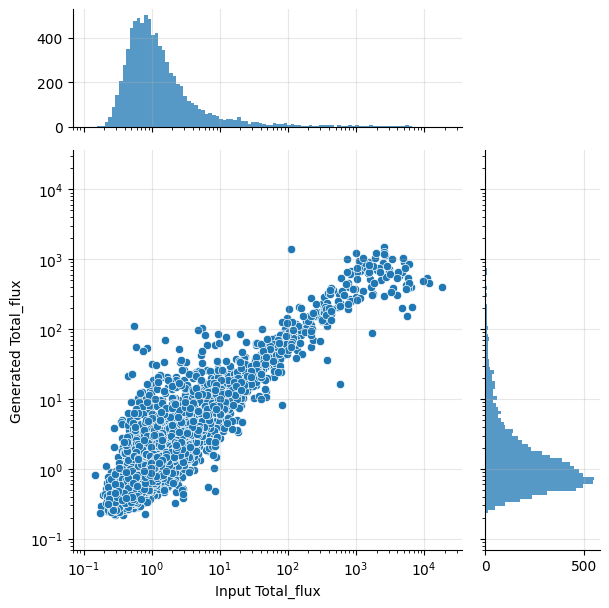

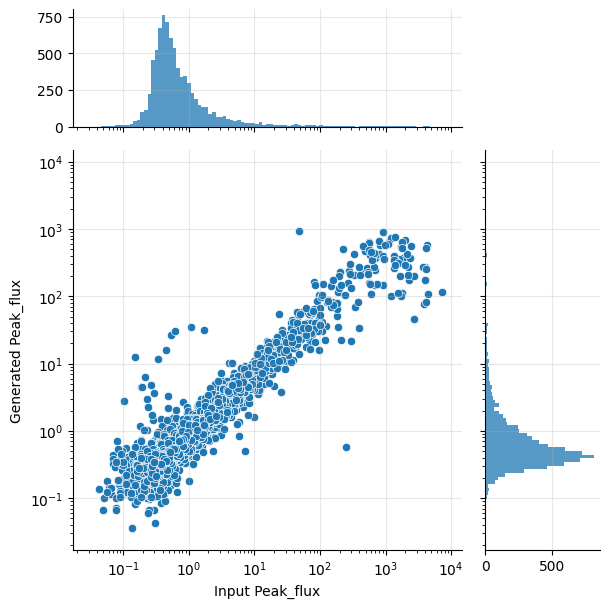

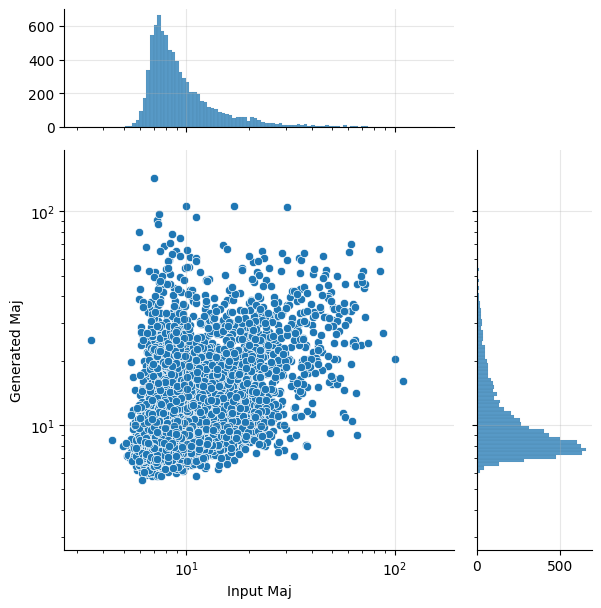

In [103]:
import seaborn as sns

titles = ["Total_flux", "Peak_flux", "Maj"]

for i, title in enumerate(titles):
    bins = auto_log_bins([all_inp[i], all_outp[i]], num=100)
    p = sns.jointplot(
        x=all_inp[i],
        y=all_outp[i],
        kind="scatter",
        marginal_kws=dict(bins=bins, log=False),
        ratio=3,
        # cmap="viridis",
        marginal_ticks=True,
    ).set_axis_labels(f"Input {title}", f"Generated {title}")
    for ax in [p.ax_marg_x, p.ax_marg_y, p.ax_joint]:
        ax.grid(alpha=0.3)
    p.ax_joint.set_xscale("log")
    p.ax_joint.set_yscale("log")

In [ ]:
bins = np.geomspace(6, 300, 200)

plt.hist(all_inp[2], bins=bins, histtype="step", label="Input")
plt.xscale("log")

In [ ]:
from math import prod


size_quadrants = (5, 5)
src_per_q_len = 2
batch_size = 4
n_iter = 1  # 2

# For even sampling across range of selected quantity
qty = "Maj"  # Total_flux, Peak_flux, Maj
qty_bin_args = 6, 300, 200  # Min, Max, N_bins
scale_ctxt = True  # Whether to scale context values
min_fpeak = 1

n_per_img = prod(size_quadrants) * src_per_q_len**2
n_per_it = n_per_img * batch_size
mn, mx, nb = qty_bin_args
if qty == "Peak_flux":
    mn = max(mn, min_fpeak)
qty_bins = np.geomspace(mn, mx, min(nb, n_per_it))
fpeak_flag = dr3_cat["Peak_flux"] >= min_fpeak
dr3_cat_fpeak = dr3_cat[fpeak_flag].reset_index(drop=True)
qty_bin_idxs = np.digitize(dr3_cat_fpeak[qty].values, qty_bins)

img_batches = []
for itr in range(n_iter):
    # Number of samples
    # Make ctxt map
    print(f"Iteration {itr + 1}/{n_iter}: Making context map...")

    # Fill with values sampled from dr3 catalog,
    # ensuring balanced sampling across log-bins in peak flux.
    print("Sampling context values from DR3 catalog...")

    # Pick equal number of samples from every bin:
    n_samples = n_per_it
    unique_bins = np.unique(qty_bin_idxs)
    n_per_bin = max(int(np.ceil(n_samples / len(unique_bins))), 1)
    print(
        f"Sampling {n_samples} sources for context from {len(unique_bins)} bins,"
        f" {n_per_bin} per bin."
    )
    idx = []
    for b in unique_bins:
        bin_idxs = np.argwhere(qty_bin_idxs == b).ravel()
        chosen = np.random.choice(
            bin_idxs, size=n_per_bin, replace=(len(bin_idxs) <= n_per_bin)
        )
        idx.extend(chosen.tolist())
    assert len(idx) >= n_samples, (
        f"Not enough samples drawn ({len(idx)}) to fill batch ({n_samples}).\n"
        f"Numbers: n_per_it={n_per_it}, unique_bins={len(unique_bins)},"
        f" n_per_bin={n_per_bin}"
    )

    idx = torch.tensor(idx)[torch.randperm(len(idx))][:n_samples]
    # Sort by quantity
    idx = idx[torch.argsort(torch.tensor(dr3_cat_fpeak.iloc[idx][qty].values))]

In [ ]:
maj_vals = dr3_cat_fpeak.iloc[idx]["Maj"].values

plt.hist(maj_vals, bins=qty_bins, histtype="step")
plt.xscale("log")

Map plot with input-output markers:

In [ ]:
batch_iter = iter(
    range(len(sampled_imgs) // n_batch + int(bool(len(sampled_imgs) % n_batch)))
)

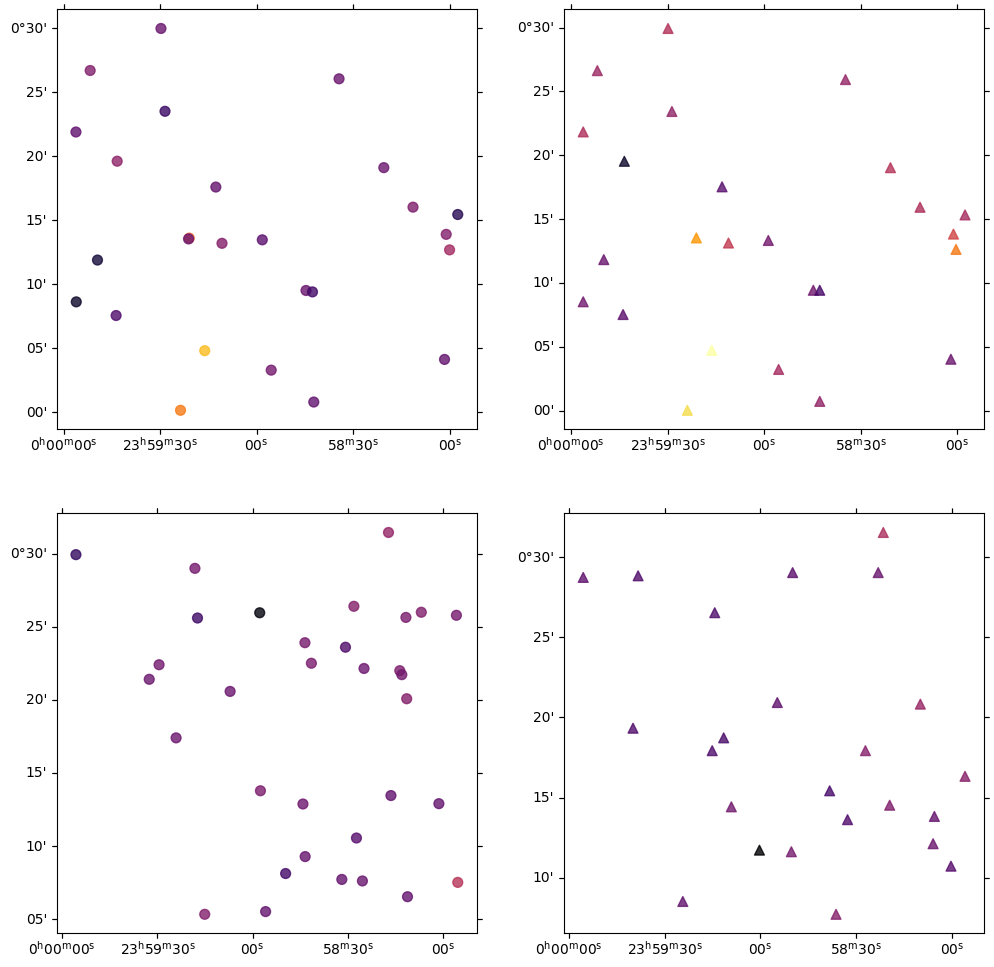

In [ ]:
i = 0

get_nsrc = lambda i: match_dicts[i]["matched_in"].size
match_dict = match_dicts[i]
srl = srls[i]


fig, axs = plt.subplots(
    2, 2, figsize=(12, 12), subplot_kw={"projection": wcs, "box_aspect": 1}
)

# Define common color scale
all_fpeak = np.concatenate([c["Peak_flux"] for c in match_dict.values()])
vmin = np.log(all_fpeak).min()
vmax = np.log(all_fpeak).max()

ax = axs[0][0]
c = match_dict["matched_out"]
ax.scatter_coord(
    SkyCoord(c["RA"], c["DEC"], unit="deg"),
    marker="o",
    c=np.log(c["Peak_flux"].values),
    cmap="inferno",
    vmin=vmin,
    vmax=vmax,
    # facecolor="none",
    # color="red",
    s=50,
    alpha=0.8,
)

ax = axs[0][1]
c = match_dict["matched_in"]
ax.scatter_coord(
    SkyCoord(c["RA"], c["DEC"], unit="deg"),
    marker="^",
    c=np.log(c["Peak_flux"].values),
    cmap="inferno",
    vmin=vmin,
    vmax=vmax,
    # facecolor="none",
    # color="red",
    s=50,
    alpha=0.8,
)

ax = axs[1][0]
c = match_dict["unmatched_out"]
ax.scatter_coord(
    SkyCoord(c["RA"], c["DEC"], unit="deg"),
    marker="o",
    c=np.log(c["Peak_flux"].values),
    cmap="inferno",
    vmin=vmin,
    vmax=vmax,
    # facecolor="none",
    # color="red",
    s=50,
    alpha=0.8,
)

ax = axs[1][1]
c = match_dict["unmatched_in"]
ax.scatter_coord(
    SkyCoord(c["RA"], c["DEC"], unit="deg"),
    marker="^",
    c=np.log(c["Peak_flux"].values),
    cmap="inferno",
    vmin=vmin,
    vmax=vmax,
    # facecolor="none",
    # color="red",
    s=50,
    alpha=0.8,
)

for ax in axs.flatten():
    for c in ax.coords:
        c.set_auto_axislabel(False)
    ax.set_xlabel("")
    ax.set_ylabel("")

In [ ]:
help(ax.coords[0])

In [ ]:
from plotting.images import plot_image_grid
from astropy.coordinates import SkyCoord
import pandas as pd


i_batch = next(batch_iter)
print(i_batch)

batch = sampled_imgs[
    i_batch * n_batch : min((i_batch + 1) * n_batch, sampled_imgs.shape[0])
]
srl_batch = srls[i_batch * n_batch : min((i_batch + 1) * n_batch, len(srls))]
nsrc = lambda i: match_dicts[i]["matched_in"].size

fig, axs = plot_image_grid(batch, img_side_len=16, origin="lower")
for i, ax in enumerate(axs.flatten() if n_side > 1 else [axs]):

    peak_in = all_inp[1][0 if i == 0 else nsrc(i - 1) : nsrc(i)]
    peak_out = all_outp[1][0 if i == 0 else nsrc(i - 1) : nsrc(i)]
    ax.scatter(
        *wcs.world_to_pixel(match_dicts[i]["matched_out"]),
        marker="o",
        c=np.log(peak_out),
        cmap="inferno",
        s=50,
        alpha=0.8,
    )

fig.show()

### Look at examples:

In [144]:
ctxt.shape, type(ctxt)

((256, 4, 128, 128), numpy.ndarray)

In [166]:
# Select images based on condition:

# High flux sources in input
min_ftot = 1e3
flag = (ctxt[:, 1] > min_ftot).any(axis=(-2, -1))
flag_idxs = np.argwhere(flag).ravel()

(<Figure size 1600x1600 with 16 Axes>,
 array([[<Axes: >, <Axes: >, <Axes: >, <Axes: >],
        [<Axes: >, <Axes: >, <Axes: >, <Axes: >],
        [<Axes: >, <Axes: >, <Axes: >, <Axes: >],
        [<Axes: >, <Axes: >, <Axes: >, <Axes: >]], dtype=object))

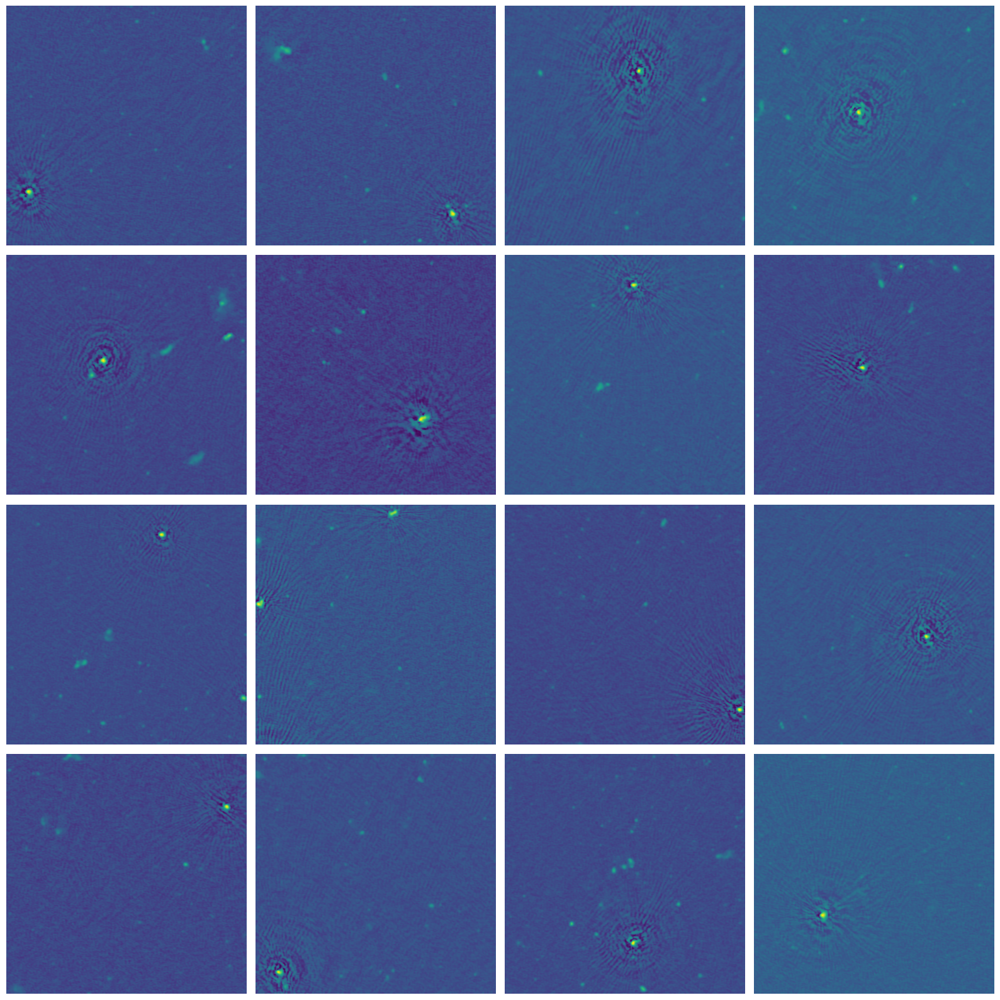

In [ ]:
# Plot examples:

# Random sub-selection
np.random.seed(42)
sel_idxs = np.random.choice(flag_idxs, size=16, replace=False)

sel_imgs = sampled_imgs[sel_idxs]

fig, axs = plot_image_grid(sel_imgs, img_side_len=4)

## ICM Resample (Legacy)

1. Run script ldm_resample.py

2. Load results:

In [ ]:
mosaic = "P9Hetdex01"
cutout_size_px = 1024  # Size of the cutout in pixels

res_parent = paths.ANALYSIS_PARENT / "ldm"
folder_name = f"ICM-resample_{mosaic}-{cutout_size_px}x{cutout_size_px}"
# folder_name = 'ICM-resample_P9Hetdex01-4096x4096'
res_folder = res_parent / (folder_name + "-modelCond")
# res_folder_v2 = res_parent / (folder_name + "-v2-two_model_guidance")

import analysis.bdsf_analysis

reload(analysis.bdsf_analysis)
from analysis.bdsf_analysis import load_multistep_output

map_res = load_multistep_output(res_folder / "bdsf_result_image")
sample_res = load_multistep_output(res_folder / "bdsf_result_sample")
# sample_res_v2 = load_multistep_output(res_folder_v2 / "bdsf_result_sample")

3. Load catalog for given mosaic & cutout:

In [ ]:
# Load DR3 catalog and filter for mosaic
from astropy.table import Table

cat = Table.read(paths.LOTSS_DR3_CAT).to_pandas()
# Keep only relevant columns for faster processing
names = ["RA", "DEC", "Total_flux", "Peak_flux", "Maj"]
cat = cat[names]
# Sort by DEC for faster processingq
cat.sort_values(by="DEC", inplace=True)

# Filter for sources in the mosaic
from data.obs.micromaps.utils import filter_catalog_by_wcs

sub_cat = filter_catalog_by_wcs(cat, map_res["wcs"])

Plots...

### Maps

In [ ]:
from data.trf.scalers import LOFARScaler

scaler = LOFARScaler.load("LOFAR_scaler_II")

#### Original vs. n-th Image in Batch

In [ ]:
from plotting.maps import plot_sky_map, double_map_plot
from plotting.images import plot_image_grid
import numpy as np

samples_batch = np.load(res_folder / 'samples.npy')
n = 2

%matplotlib widget
double_map_plot(
    scaler.scale(map_res['input_image']),
    # map_res['input_image'],
    samples_batch[n],
    # scaler.inverse_scale(samples_batch[0]),
    wcs=map_res['wcs'],
    norm_quantile=None
)

#### Entire Batch

In [ ]:
from plotting.maps import plot_sky_map, double_map_plot
from plotting.images import plot_image_grid
import numpy as np

batch = np.load(res_folder / 'samples.npy')

%matplotlib inline
plot_image_grid(
    batch,
    n_cols=2
)


In [ ]:
np.sort(batch[0].flatten())[-40:]

### Histograms

In [ ]:
import plotting.catalog as catplt
reload(catplt)

%matplotlib inline
catplt.holy_trinity_histograms(
    [
        sub_cat, 
        map_res['catalogs']['srl'], 
        sample_res['catalogs']['srl'], 
        # sample_res_v2['catalogs']['srl']
    ],
    catalog_names=[
        'Input',
        'Mosaic',
        'Sample v1',
        # 'Sample v2'
    ],
    nonzero_bin_thresh=1
)

### Source Matching:

4. Matching:

In [ ]:
import analysis.bdsf_analysis

reload(analysis.bdsf_analysis)
from analysis.bdsf_analysis import match_catalogs

matching_result = match_catalogs(
    sample_res["catalogs"]["srl"],
    sub_cat,
    thr_arcsec=50,
)

In [ ]:
matching_result.keys()

In [ ]:
# Print Numbers

print(f"Total sources in SRL: {len(sample_res['catalogs']['srl'])}")
print(f"Matched sources: {len(matching_result['matched_cat1'])}")
print(f"Unmatched sources: {len(matching_result['unmatched_cat1'])}")
print(f"Total sources in catalog: {len(sub_cat)}")
print(f"Matched catalog: {len(matching_result['matched_cat2'])}")
print(f"Unmatched catalog: {len(matching_result['unmatched_cat2'])}")

#### Inverse cumulative NN-distance distribution

In [ ]:
import plotting.catalog as catplt
reload(catplt)
import astropy.units as u

d2d_arcsec = matching_result['d2d'].to(u.arcsec).value

%matplotlib inline
catplt.match_inv_cumul(
    d2d_arcsec[~np.isnan(d2d_arcsec)],
    logax=(True, False),
)

#### Maps with markers

In [ ]:
import plotting.maps
reload(plotting.maps)
from plotting.maps import plot_sky_map, double_map_plot
from astropy.coordinates import SkyCoord

%matplotlib widget
fig, axs = double_map_plot(
    scaler.scale(map_res['input_image']),
    # map_res['input_image'],
    scaler.scale(sample_res['input_image']),
    wcs=sample_res['wcs'],
    norm_quantile=None,
    scalebar_size_arcsec=50,
    # minmax=True,
)
# Matched in first ax
axs[0].scatter_coord(
    SkyCoord(
        matching_result['matched_cat1']['RA'],
        matching_result['matched_cat1']['DEC'],
        unit='deg',
    ),
    marker='s',
    color='aqua',
    facecolor='none',
    s=55,
    alpha=0.5,
    label='Matched SRL',
)
axs[0].scatter_coord(
    SkyCoord(
        matching_result['matched_cat2']['RA'],
        matching_result['matched_cat2']['DEC'],
        unit='deg',
    ),
    marker='^',
    color='red',
    facecolor='none',
    s=50,
    alpha=0.5,
    label='Matched Catalog',
)
axs[0].scatter_coord(
    SkyCoord(
        matching_result['unmatched_cat2']['RA'],
        matching_result['unmatched_cat2']['DEC'],
        unit='deg',
    ),
    marker='^',
    color='red',
    facecolor='none',
    s=50,
    alpha=0.5,
    label='Matched Catalog',
)

# Unmatched in second ax
axs[1].scatter_coord(
    SkyCoord(
        matching_result['matched_cat1']['RA'],
        matching_result['matched_cat1']['DEC'],
        unit='deg',
    ),
    marker='s',
    color='aqua',
    facecolor='none',
    s=55,
    alpha=0.5,
    label='Unmatched SRL',
)
axs[1].scatter_coord(
    SkyCoord(
        matching_result['unmatched_cat1']['RA'],
        matching_result['unmatched_cat1']['DEC'],
        unit='deg',
    ),
    marker='s',
    color='aqua',
    facecolor='none',
    s=55,
    alpha=0.5,
    label='Unmatched SRL',
)
axs[1].scatter_coord(
    SkyCoord(
        matching_result['matched_cat2']['RA'],
        matching_result['matched_cat2']['DEC'],
        unit='deg',
    ),
    marker='^',
    color='red',
    facecolor='none',
    s=50,
    alpha=0.5,
    label='Unmatched Catalog',
)


#### Scatter Plots

In [ ]:
import plotting.catalog as catplt

reload(catplt)

%matplotlib inline
catplt.match_scatter_plots(
    matching_result["matched_cat1"],
    sub_cat.iloc[matching_result["idx"][matching_result["match_mask"]]],
    logax=(True, True),
)

#### Histograms matched vs. unmatched

In [ ]:
import plotting.catalog as catplt

reload(catplt)

catplt.holy_trinity_histograms(
    [
        matching_result["matched_cat1"],
        matching_result["unmatched_cat1"],
        matching_result["matched_cat2"],
        matching_result["unmatched_cat2"],
    ],
    catalog_names=[
        "Matched SRL",
        "Unmatched SRL",
        "Matched Catalog",
        "Unmatched Catalog",
    ],
    cmap="Paired",
)